# E2 Test & Evaluation

Experiment 2 (Option A): **Training time (epochs) vs performance** (no early stopping)

We sweep epoch budgets **E ∈ {5, 10, 20, 40, 80}** with a **fixed freezing configuration** (default: F2) for each model (YOLOv8m vs RT-DETR-L).


## 0. Setup


### 0.1 Clone Repo to Colab /content

In [22]:
# Check if in Colab
import sys
IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
    print("Running in Google Colab")
    # Clone repo if not already cloned
    import os
    if not os.path.exists('Deep_Learning_Gil_Alon'):
        !git clone https://github.com/gil-attar/Deep_Learning_Project_Gil_Alon.git Deep_Learning_Gil_Alon
    %cd Deep_Learning_Gil_Alon
else:
    print("Running locally")
    import os
    from pathlib import Path
    # Navigate to project root if in notebooks/
    if os.path.basename(os.getcwd()) == 'notebooks':
        os.chdir('..')

print(f"Working directory: {os.getcwd()}")

Running in Google Colab
Cloning into 'Deep_Learning_Gil_Alon'...
remote: Enumerating objects: 622, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 622 (delta 11), reused 9 (delta 3), pack-reused 598 (from 1)
Receiving objects: 100% (622/622), 16.60 MiB | 14.96 MiB/s, done.
Resolving deltas: 100% (353/353), done.
/content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon
Working directory: /content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon


### 0.2 Mounting Google Drive & Setting up Folder Structure for Results

In [23]:
# Mount Google Drive for saving run results
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [24]:
import time
from pathlib import Path

PROJECT_NAME = "Deep_Learning_Project_Gil_Alon"

# IMPORTANT:
# - For a fresh folder each time, keep the timestamp.
# - To continue the SAME sweep after a disconnect, set RUN_ID to a fixed string
#   (e.g., RUN_ID="E2_fullsweep_v1") and reuse it after reconnect.
RUN_ID = time.strftime("E2_%Y%m%d_%H%M%S")

DRIVE_ROOT = Path("/content/drive/MyDrive/Colab_Outputs") / PROJECT_NAME / RUN_ID

PERSIST_E2_RUNS = DRIVE_ROOT / "E2_runs"       # where Experiment 2 outputs will live
PERSIST_WEIGHTS = DRIVE_ROOT / "pretrained"    # optional cache for pretrained weights

PERSIST_E2_RUNS.mkdir(parents=True, exist_ok=True)
PERSIST_WEIGHTS.mkdir(parents=True, exist_ok=True)

print("Drive root:", DRIVE_ROOT)
print("E2 runs:", PERSIST_E2_RUNS)
print("Weights cache:", PERSIST_WEIGHTS)


Drive root: /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621
E2 runs: /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/E2_runs
Weights cache: /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/pretrained


### 0.3 Symlink the repo’s runs/ to Drive

In [25]:
from pathlib import Path

REPO = Path.cwd()
print("REPO =", REPO)

E2_RUNS_IN_REPO = REPO / "experiments" / "Experiment_2" / "runs"

# Safety check
assert REPO.exists(), f"Repo path does not exist: {REPO}"

# Remove local runs dir if it exists, then link to Drive
!rm -rf "{E2_RUNS_IN_REPO}"
!ln -s "{PERSIST_E2_RUNS}" "{E2_RUNS_IN_REPO}"

print("Symlink created:")
!ls -la "{E2_RUNS_IN_REPO}"


REPO = /content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon
Symlink created:
lrwxrwxrwx 1 root root 94 Jan 21 19:06 /content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon/experiments/Experiment_2/runs -> /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/E2_runs


#### 0.4 Re-routing Model Weights to Drive

In [26]:
WEIGHTS_IN_REPO = REPO / "artifacts" / "weights"

!rm -rf "{WEIGHTS_IN_REPO}"
!ln -s "{PERSIST_WEIGHTS}" "{WEIGHTS_IN_REPO}"

print("Weights dir now points to Drive:")
!ls -la "{WEIGHTS_IN_REPO}"


Weights dir now points to Drive:
lrwxrwxrwx 1 root root 97 Jan 21 19:06 /content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon/artifacts/weights -> /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/pretrained


In [27]:
# Install dependencies
!pip install -q ultralytics roboflow pyyaml pillow numpy matplotlib pandas tqdm


In [28]:
# Check GPU
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

PyTorch version: 2.9.0+cu126
CUDA available: True
GPU: NVIDIA A100-SXM4-80GB


## 1. Download Dataset

In [29]:
# Set Roboflow API key
import os
os.environ["ROBOFLOW_API_KEY"] = "zEF9icmDY2oTcPkaDcQY"  # Your API key

# Download dataset
!python scripts/download_dataset.py --output_dir data/raw

DOWNLOADING FOOD INGREDIENTS DATASET
  Workspace: gaworkspace-utcbg
  Project:   food-ingredients-dataset-2-rewtd
  Version:   1
  Output:    data/raw
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to FOOD-INGREDIENTS-dataset-2-1 in yolov8:: 100% 3980/3980 [00:00<00:00, 6968.70it/s]
Downloaded to: /content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon/FOOD-INGREDIENTS-dataset-2-1
  Moved train/
  Moved valid/
  Moved test/
  Copied data.yaml

DOWNLOAD COMPLETE
  train: 1384 images
  valid: 200 images
  test: 400 images

✓ Dataset saved to data/raw

IMPORTANT: data/raw/ is READ-ONLY. Never modify these files.

Next step: Run build_evaluation_index.py to create evaluation artifacts.


In [30]:
# Verify dataset downloaded
!echo "Train images: $(ls data/raw/train/images/ 2>/dev/null | wc -l)"
!echo "Valid images: $(ls data/raw/valid/images/ 2>/dev/null | wc -l)"
!echo "Test images: $(ls data/raw/test/images/ 2>/dev/null | wc -l)"

Train images: 1384
Valid images: 200
Test images: 400


## 2. Fetch COCO-Pretrained Weights (YOLOv8m + RT-DETR-L)

Will be stored under `artifacts/weights/`.


In [31]:
# Fetch pretrained weights (idempotent)
!bash scripts/fetch_weights.sh


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 49.7M  100 49.7M    0     0  53.1M      0 --:--:-- --:--:-- --:--:-- 90.1M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 63.4M  100 63.4M    0     0  27.4M      0  0:00:02  0:00:02 --:--:-- 33.4M
OK: weights are present under artifacts/weights/
lrwxrwxrwx 1 root root 97 Jan 21 19:06 artifacts/weights -> /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/pretrained


## 3. Build Evaluation Indices

In [32]:
# Build train/val/test indices (with ACTUAL image dimensions - this is critical!)
# Remove old indices first to ensure fresh rebuild
import shutil
from pathlib import Path

if Path("data/processed/evaluation").exists():
    shutil.rmtree("data/processed/evaluation")
    print("✓ Removed old indices")

!python scripts/build_evaluation_indices.py \
    --dataset_root data/raw \
    --output_dir data/processed/evaluation

✓ Removed old indices
BUILD EVALUATION INDICES (Train/Val/Test)
Dataset root: data/raw
Output dir:   data/processed/evaluation

Loaded 26 classes from data.yaml

Processing train split: 1384 images...
✓ Saved train_index.json
  - Images: 1384
  - Objects: 3114
  - Difficulty: {'easy': 1078, 'medium': 202, 'hard': 104}

Processing valid split: 200 images...
✓ Saved val_index.json
  - Images: 200
  - Objects: 476
  - Difficulty: {'easy': 149, 'medium': 31, 'hard': 20}

Processing test split: 400 images...
✓ Saved test_index.json
  - Images: 400
  - Objects: 856
  - Difficulty: {'easy': 313, 'medium': 50, 'hard': 37}

✓ All evaluation indices created!

Generated files in data/processed/evaluation/:
  - train_index.json
  - val_index.json
  - test_index.json

These files are now FROZEN for reproducibility.
Do not regenerate unless absolutely necessary.


In [33]:
# Verify indices created
import json
from pathlib import Path

test_index_path = "data/processed/evaluation/test_index.json"

if Path(test_index_path).exists():
    with open(test_index_path) as f:
        test_data = json.load(f)
    print(f"✓ Test index: {test_data['metadata']['num_images']} images")
    print(f"  Total objects: {test_data['metadata']['total_objects']}")
    print(f"  Classes: {test_data['metadata']['num_classes']}")
else:
    print(f"❌ Test index not found!")

✓ Test index: 400 images
  Total objects: 856
  Classes: 26


### 3.1. Create data.yaml for Training

In [34]:
# Create data.yaml with absolute paths for Colab
import yaml
from pathlib import Path
import os

# Get absolute path to dataset
dataset_root = Path('data/raw').resolve()

# Read original data.yaml to get class names
with open(dataset_root / 'data.yaml', 'r') as f:
    config = yaml.safe_load(f)

# Create config with ABSOLUTE paths
train_config = {
    'path': str(dataset_root),  # Absolute base path
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'names': config['names'],
    'nc': len(config['names'])
}

# Save to data/processed/
output_path = Path('data/processed/data.yaml')
output_path.parent.mkdir(parents=True, exist_ok=True)

with open(output_path, 'w') as f:
    yaml.dump(train_config, f, default_flow_style=False, sort_keys=False)

print(f"✓ Created data.yaml with absolute paths")
print(f"  Path: {train_config['path']}")
print(f"  Classes: {train_config['nc']}")

✓ Created data.yaml with absolute paths
  Path: /content/Deep_Learning_Gil_Alon/Deep_Learning_Gil_Alon/data/raw
  Classes: 26


## 4. Run Experiment 2 (Epoch Budget Sweep: YOLOv8m vs RT-DETR-L)


In [35]:
# E2 sweep configuration
DRY_RUN = False   # True: quick smoke test (E=1). False: full sweep (E in {5,10,20,40,80}).

FREEZE = "F2"            # fixed freeze preset (see experiments/Experiment_1/freezing/freeze_presets.py)
EPOCHS_LIST = "1" if DRY_RUN else "5 10 20 40 80"
IMGSZ = 640
SEED = 42

# Reporting threshold used inside the E2 runner for per-class/counting metrics.
# NOTE: the bash script must pass this through to the runner if you change it.
REPORT_CONF = 0.25

print(f"DRY_RUN={DRY_RUN} | FREEZE={FREEZE} | EPOCHS_LIST={EPOCHS_LIST} | IMGSZ={IMGSZ} | SEED={SEED} | REPORT_CONF={REPORT_CONF}")


DRY_RUN=False | FREEZE=F2 | EPOCHS_LIST=5 10 20 40 80 | IMGSZ=640 | SEED=42 | REPORT_CONF=0.25


In [36]:
# Run Experiment 2
# This calls experiments/Experiment_2/runOneTest.py for each (model, epochs) with fixed FREEZE.

# If you later update run_experiment2.sh to forward REPORT_CONF, add: REPORT_CONF={REPORT_CONF}
!FREEZE={FREEZE} EPOCHS_LIST="{EPOCHS_LIST}" IMGSZ={IMGSZ} SEED={SEED} bash experiments/Experiment_2/run_experiment2.sh


[INFO] CUDA_VISIBLE_DEVICES=0
[INFO] nvidia-smi available; GPU status:
[KEEPALIVE] 2026-01-21 19:06:41 UTC still running...
Wed Jan 21 19:06:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   46C    P0             62W /  400W |       5MiB /  81920MiB |      0%      Default |
|               

## 5. Verify Run Outputs (E2)


In [37]:
from pathlib import Path

runs_root = Path("experiments/Experiment_2/runs")
assert runs_root.exists(), f"Missing runs root: {runs_root}"

# Contract-required artifacts (E2: test-only + plots)
expected_files = [
    "run_manifest.json",
    "run_summary.json",
    "train_summary.json",
    "predictions/test_predictions.json",
    "eval/test/metrics.json",
    "eval/test/summary.csv",
    "weights/best.pt",
    "weights/last.pt",
    "eval/test/plots/threshold_sweep.png",
    "eval/test/plots/per_class_f1.png",
    "eval/test/plots/confusion_matrix.png",
    "eval/test/plots/count_mae_comparison.png",
]

missing = []
run_dirs = sorted([p for p in runs_root.glob("**/E*") if p.is_dir()])
print(f"Found {len(run_dirs)} epoch-budget run directories")

for rd in run_dirs:
    for ef in expected_files:
        if not (rd / ef).exists():
            missing.append((str(rd), ef))

if missing:
    print("WARNING: missing expected artifacts in some runs:")
    for rd, ef in missing[:120]:
        print(f"  - {rd} :: {ef}")
else:
    print("✓ All runs contain the expected artifacts.")

Found 10 epoch-budget run directories
✓ All runs contain the expected artifacts.


Saved 10 inspection grids to: experiments/Experiment_2/_plots/run_inspections


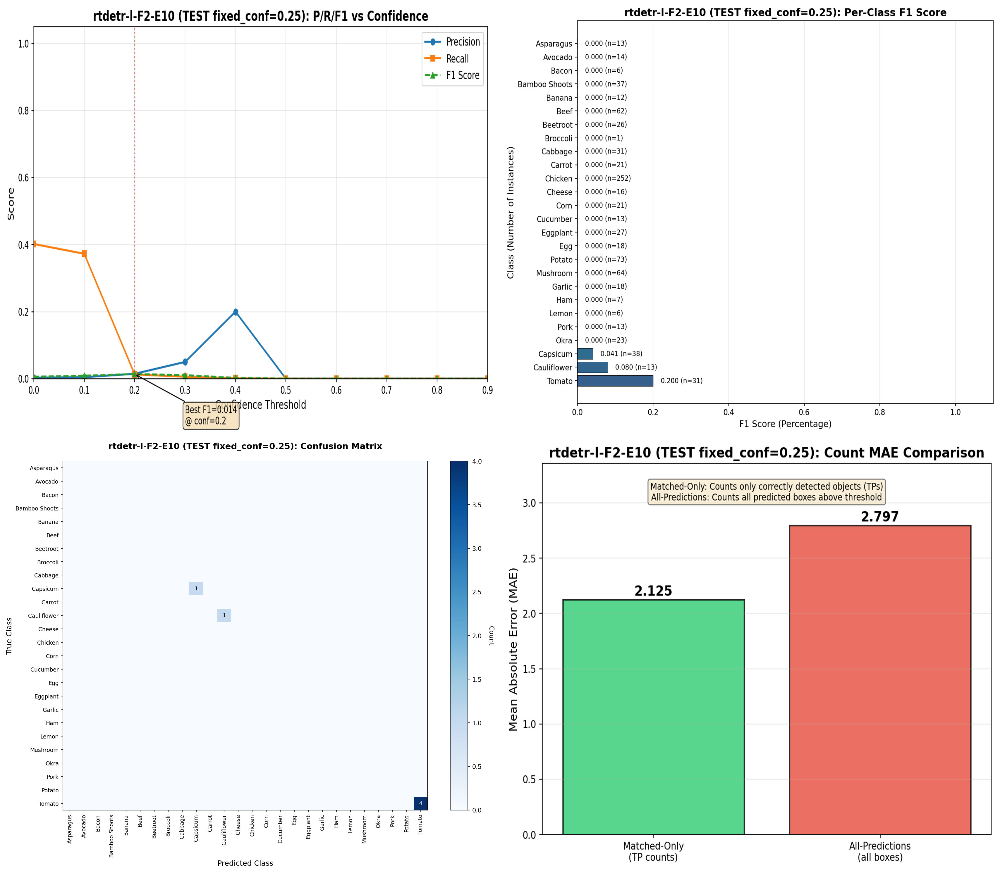

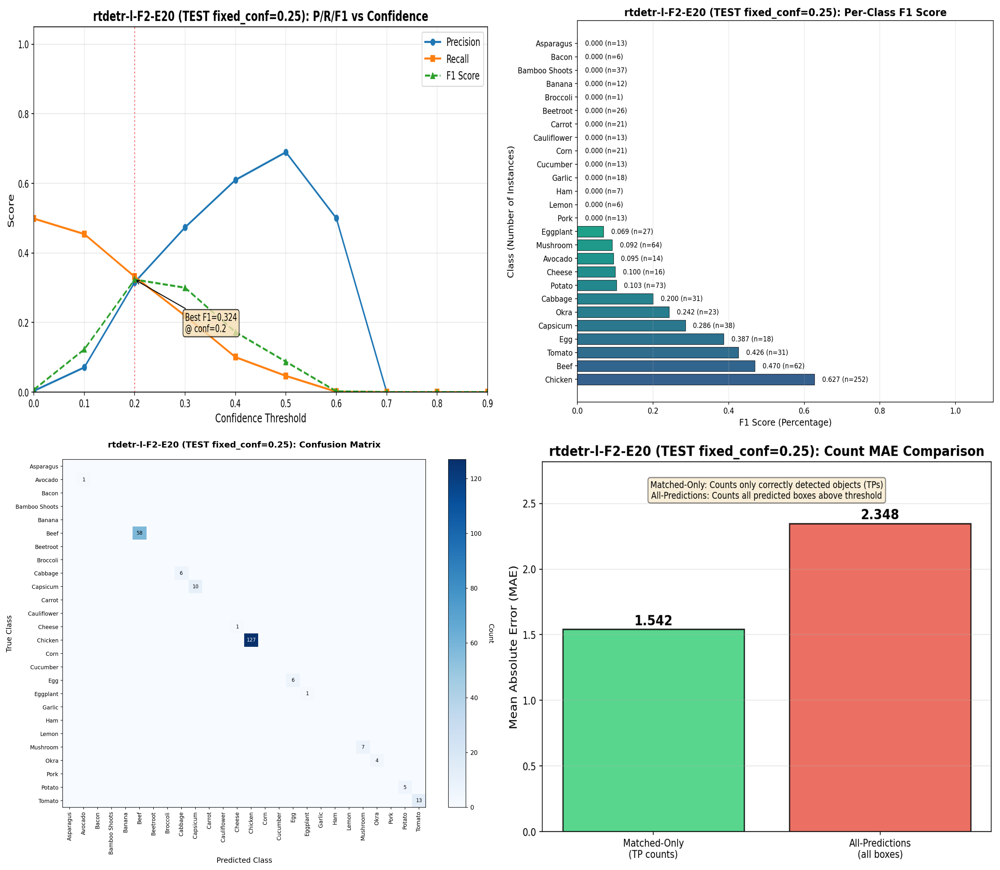

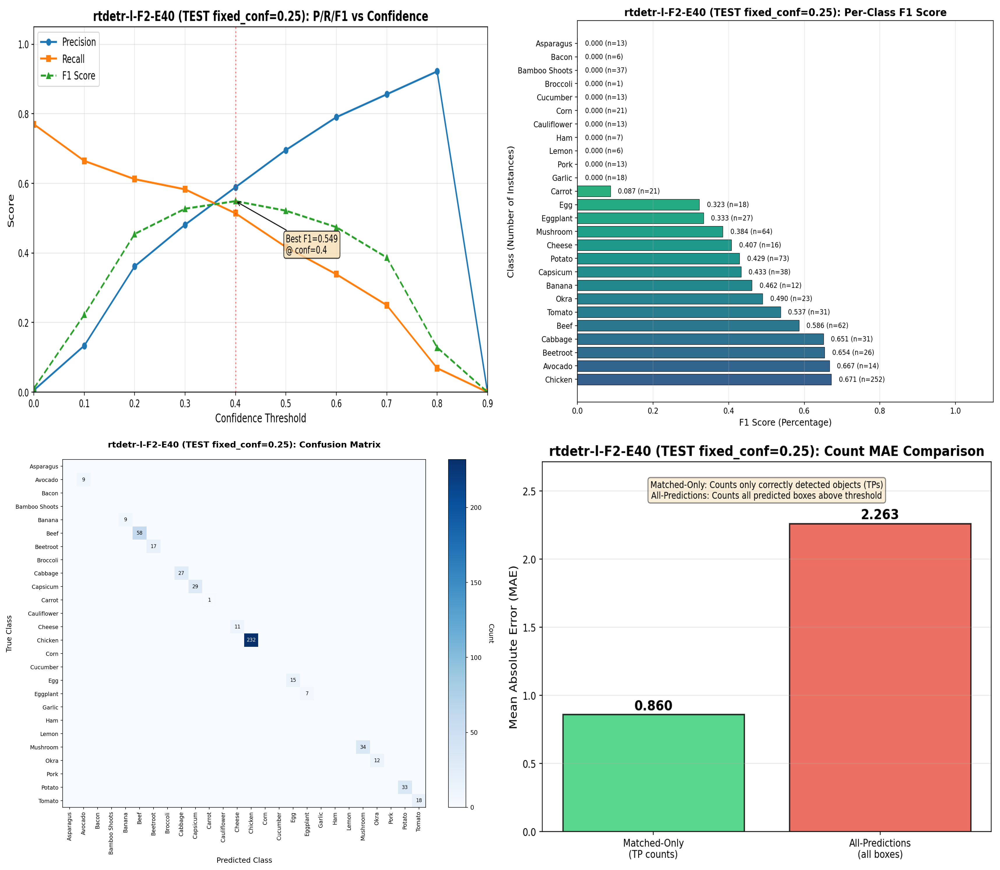

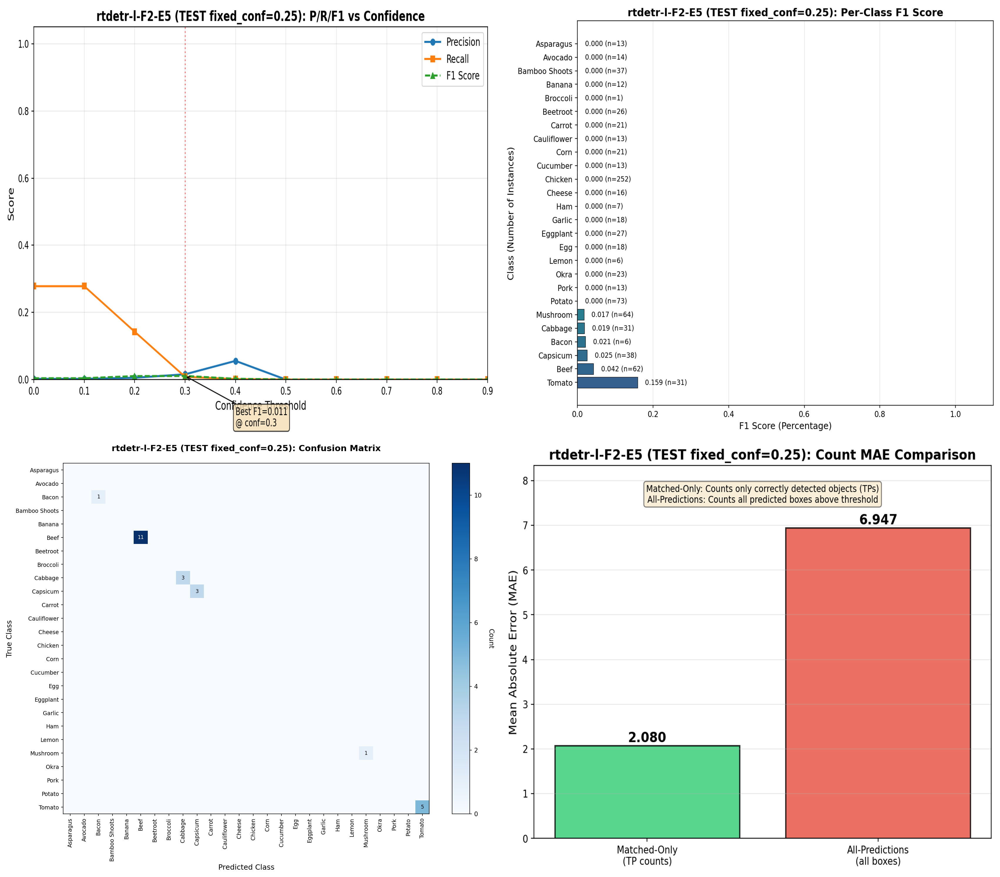

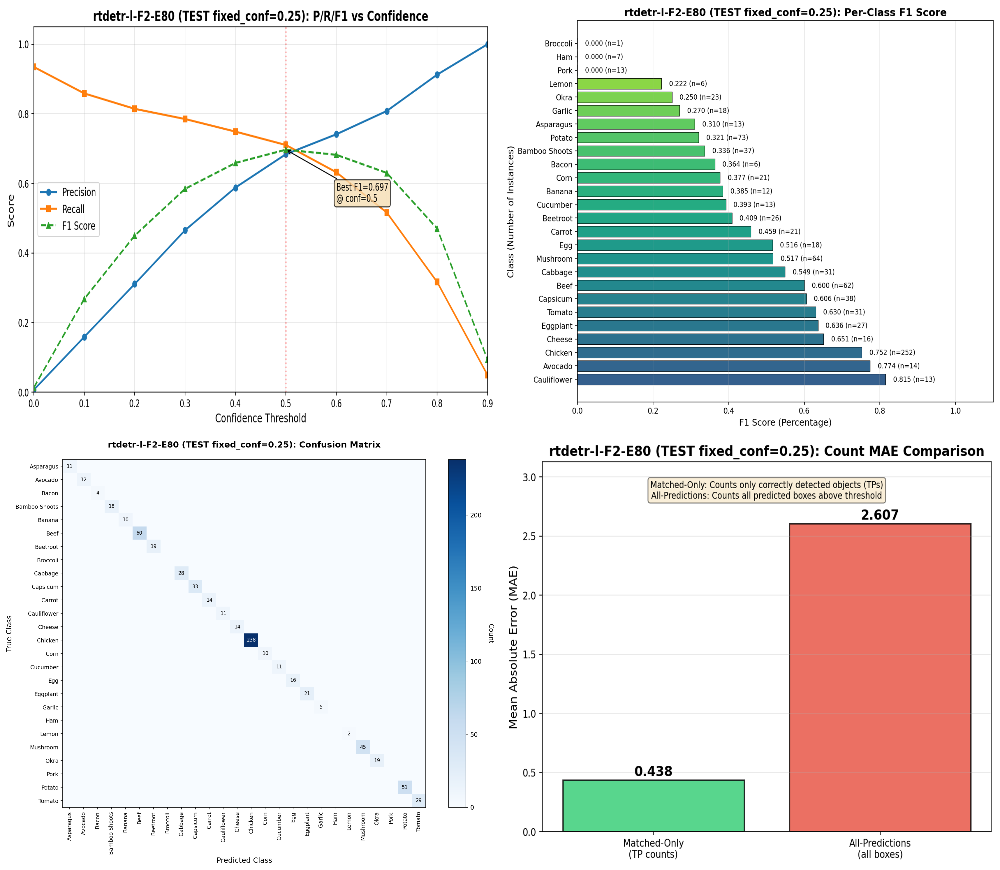

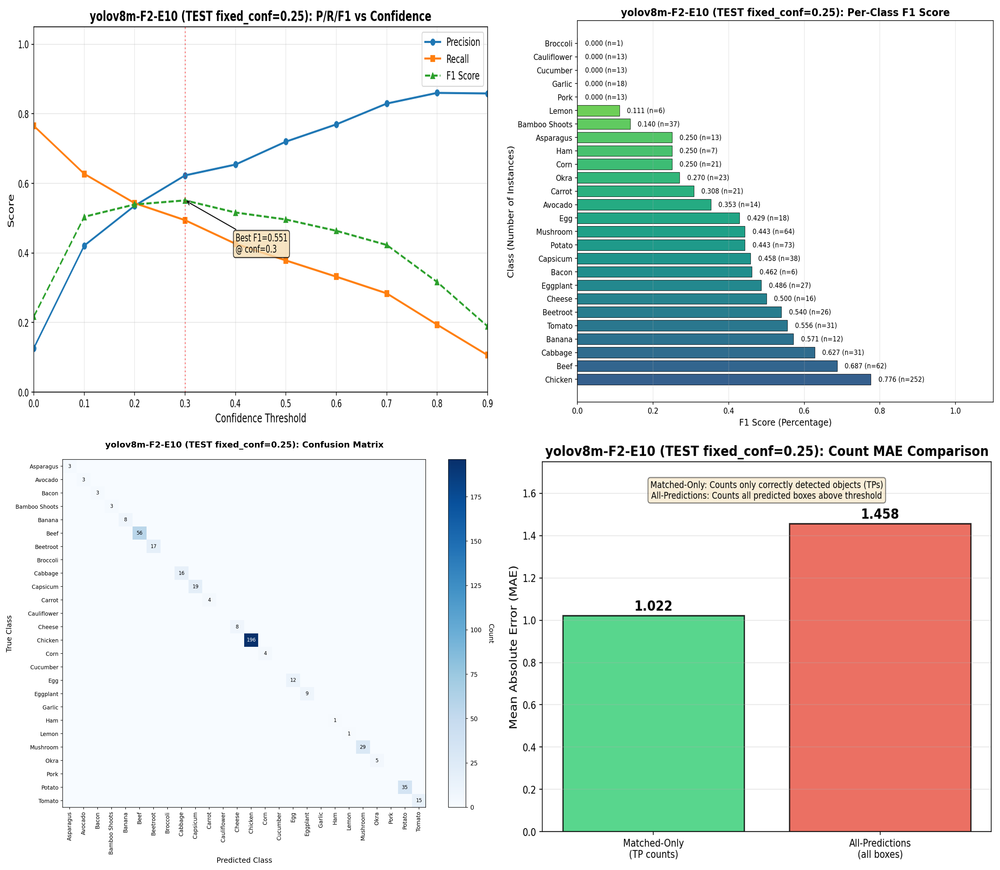

In [38]:
from pathlib import Path
from PIL import Image, ImageOps

run_dirs = sorted([p for p in runs_root.glob("*/*/E*") if p.is_dir()])

plots_rel = [
    "eval/test/plots/threshold_sweep.png",
    "eval/test/plots/per_class_f1.png",
    "eval/test/plots/confusion_matrix.png",
    "eval/test/plots/count_mae_comparison.png",
]

out_dir = Path("experiments/Experiment_2/_plots/run_inspections")
out_dir.mkdir(parents=True, exist_ok=True)

def _open_rgb(p: Path):
    im = Image.open(p).convert("RGB")
    # add thin border for readability
    return ImageOps.expand(im, border=6, fill="white")

def _grid_2x2(imgs):
    # expects up to 4 images
    if not imgs:
        return None
    # pad to 4
    while len(imgs) < 4:
        imgs.append(Image.new("RGB", imgs[0].size, "white"))
    w = max(i.size[0] for i in imgs)
    h = max(i.size[1] for i in imgs)
    imgs = [i.resize((w, h)) for i in imgs]
    grid = Image.new("RGB", (2*w, 2*h), "white")
    grid.paste(imgs[0], (0, 0))
    grid.paste(imgs[1], (w, 0))
    grid.paste(imgs[2], (0, h))
    grid.paste(imgs[3], (w, h))
    return grid

saved = 0
missing_any = 0

for rd in run_dirs:
    imgs = []
    missing = []
    for rel in plots_rel:
        p = rd / rel
        if p.exists():
            imgs.append(_open_rgb(p))
        else:
            missing.append(rel)

    if missing:
        missing_any += 1
        # Still save whatever exists; helps debug partial runs.

    grid = _grid_2x2(imgs)
    if grid is None:
        continue

    # Name: <model>_<freeze>_E<epochs>.png (based on path segments)
    # rd = .../runs/<model>/<freeze>/E<epochs>
    parts = rd.parts
    try:
        model = parts[parts.index("runs") + 1]
        freeze = parts[parts.index("runs") + 2]
    except Exception:
        model = "unknownModel"
        freeze = "unknownFreeze"
    epochs_tag = rd.name  # "E10" etc.

    out_path = out_dir / f"{model}_{freeze}_{epochs_tag}.png"
    grid.save(out_path)
    saved += 1

print(f"Saved {saved} inspection grids to: {out_dir}")
if missing_any:
    print(f"Note: {missing_any} runs are missing at least one plot (still saved partial grids where possible).")

# Display a few examples in-notebook
from IPython.display import display
for p in sorted(out_dir.glob("*.png"))[:6]:
    display(Image.open(p))


## 6. Aggregate Metrics Across Runs (E2)


In [39]:
import json
from pathlib import Path
import pandas as pd

rows = []
for summary_path in runs_root.glob("**/run_summary.json"):
    j = json.loads(summary_path.read_text())
    m = j.get("manifest", {})
    model = m.get("model")
    freeze_id = m.get("freeze_id")
    epochs = int(m.get("epochs"))

    timing = (j.get("train", {}) or {}).get("timing", {})
    wall = timing.get("train_wall_time_seconds")
    spe = timing.get("train_seconds_per_epoch")

    # Prefer evaluator summary.csv for a single reported score (fixed threshold)
    eval_dir = Path((j.get("eval", {}) or {}).get("test", {}).get("eval_dir", ""))
    summary_csv = eval_dir / "summary.csv" if eval_dir else None

    score = None
    score_col = None
    if summary_csv and summary_csv.exists():
        df = pd.read_csv(summary_csv)
        # Try common column candidates in your evaluator outputs
        candidates = [
            "mAP50", "map50", "mAP@0.5", "mAP_0.5",
            "f1", "F1", "precision", "recall",
        ]
        for c in candidates:
            if c in df.columns:
                score_col = c
                score = float(df[c].max())
                break
        if score is None:
            # fallback: pick first numeric column (excluding ids)
            numeric_cols = [c for c in df.columns if c.lower() not in {"class", "class_id", "name"}]
            for c in numeric_cols:
                try:
                    score = float(pd.to_numeric(df[c], errors="coerce").dropna().max())
                    score_col = c
                    break
                except Exception:
                    pass

    # Secondary fallback: Ultralytics results.csv last-epoch val mAP50 if present
    if score is None:
        results_csv = summary_path.parent / "results.csv"
        if results_csv.exists():
            rdf = pd.read_csv(results_csv)
            rdf.columns = [c.strip() for c in rdf.columns]
            for c in ["metrics/mAP50(B)", "metrics/mAP50", "metrics/mAP_0.5"]:
                if c in rdf.columns:
                    score = float(rdf[c].iloc[-1])
                    score_col = c
                    break

    rows.append({
        "model": model,
        "freeze_id": freeze_id,
        "epochs": epochs,
        "train_wall_s": wall,
        "sec_per_epoch": spe,
        "score": score,
        "score_col": score_col,
        "run_dir": str(summary_path.parent),
    })

agg = pd.DataFrame(rows)
agg = agg.sort_values(["model", "epochs"]).reset_index(drop=True)
print("Runs found:", len(agg))
display(agg)

out_csv = Path("experiments/Experiment_2/runs/_aggregate_e2.csv")
out_csv.parent.mkdir(parents=True, exist_ok=True)
agg.to_csv(out_csv, index=False)
print("Saved:", out_csv.resolve())


Runs found: 10


,model,freeze_id,epochs,train_wall_s,sec_per_epoch,score,score_col,run_dir
0,rtdetr-l,F2,5,267.3322,53.4664,0.0107,f1,experiments/Experiment_2/runs/rtdetr-l/F2/E5
1,rtdetr-l,F2,10,467.9648,46.7965,0.0137,f1,experiments/Experiment_2/runs/rtdetr-l/F2/E10
2,rtdetr-l,F2,20,886.9738,44.3487,0.3235,f1,experiments/Experiment_2/runs/rtdetr-l/F2/E20
3,rtdetr-l,F2,40,1712.0752,42.8019,0.5490,f1,experiments/Experiment_2/runs/rtdetr-l/F2/E40
4,rtdetr-l,F2,80,3332.0914,41.6511,0.6968,f1,experiments/Experiment_2/runs/rtdetr-l/F2/E80
5,yolov8m,F2,5,112.4052,22.4810,0.3851,f1,experiments/Experiment_2/runs/yolov8m/F2/E5
6,yolov8m,F2,10,187.4990,18.7499,0.5511,f1,experiments/Experiment_2/runs/yolov8m/F2/E10
7,yolov8m,F2,20,348.1629,17.4081,0.6513,f1,experiments/Experiment_2/runs/yolov8m/F2/E20
8,yolov8m,F2,40,665.7366,16.6434,0.6911,f1,experiments/Experiment_2/runs/yolov8m/F2/E40
9,yolov8m,F2,80,1294.9229,16.1865,0.6992,f1,experiments/Experiment_2/runs/yolov8m/F2/E80


Saved: /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/E2_runs/_aggregate_e2.csv


In [40]:
import json
import math
from pathlib import Path
import pandas as pd
import numpy as np

# This cell summarizes each E* run directory using:
# - run_manifest.json (trainable params, settings)
# - eval/test/metrics.json (test-side evaluator metrics)
# - predictions/test_predictions.json (inference timing)
# - results.csv (per-epoch Ultralytics log, if present)

def _safe_get(d, keys, default=None):
    cur = d
    for k in keys:
        if not isinstance(cur, dict) or k not in cur:
            return default
        cur = cur[k]
    return cur

def auc_trapz(x, y):
    x = np.asarray(x, dtype=float)
    y = np.asarray(y, dtype=float)
    if len(x) < 2:
        return np.nan
    return float(np.trapz(y, x))

def get_map50_col(ep_df: pd.DataFrame):
    # Common Ultralytics mAP50 column names
    candidates = [
        "metrics/mAP50(B)",
        "metrics/mAP50",
        "metrics/mAP_0.5",
        "metrics/mAP@0.5",
        "metrics/mAP50-95(B)",  # fallback (not mAP50 but better than nothing)
    ]
    for c in candidates:
        if c in ep_df.columns:
            return c
    # Last resort: any column containing 'mAP50'
    for c in ep_df.columns:
        if "map50" in c.lower():
            return c
    return None

def get_train_loss_cols(ep_df: pd.DataFrame):
    # YOLO typically: train/box_loss, train/cls_loss, train/dfl_loss
    return [c for c in ep_df.columns if c.startswith('train/') and 'loss' in c.lower()]

def get_val_loss_cols(ep_df: pd.DataFrame):
    # YOLO typically: val/box_loss, val/cls_loss, val/dfl_loss
    return [c for c in ep_df.columns if c.startswith('val/') and 'loss' in c.lower()]

rows = []
for rd in run_dirs:  # run_dirs should be E* directories (see prior cell)
    rd = Path(rd)

    manifest = json.loads((rd / "run_manifest.json").read_text())
    test_metrics = json.loads((rd / "eval/test/metrics.json").read_text())
    preds_test = json.loads((rd / "predictions/test_predictions.json").read_text())

    model = manifest.get('model')
    freeze_id = manifest.get('freeze_id')
    epochs = manifest.get('epochs')

    # Per-epoch log (Ultralytics)
    ep = None
    results_csv = rd / "results.csv"
    if results_csv.exists():
        ep = pd.read_csv(results_csv)
        ep.columns = [c.strip() for c in ep.columns]
        if "epoch" not in ep.columns:
            ep = ep.reset_index().rename(columns={"index": "epoch"})

    map50_col = None
    best_val_map50 = np.nan
    best_epoch = np.nan
    epoch_to_90pct = np.nan
    auc_map50 = np.nan

    train_loss_cols, val_loss_cols = [], []
    best_train_loss = np.nan
    best_val_loss = np.nan
    gen_gap_at_best = np.nan

    if ep is not None and len(ep) > 0:
        map50_col = get_map50_col(ep)
        if map50_col is not None and map50_col in ep.columns and "epoch" in ep.columns:
            y = pd.to_numeric(ep[map50_col], errors='coerce').to_numpy(dtype=float)
            x = pd.to_numeric(ep["epoch"], errors='coerce').to_numpy(dtype=float)

            if np.isfinite(y).any():
                best_idx = int(np.nanargmax(y))
                best_epoch = int(ep.loc[best_idx, "epoch"]) if np.isfinite(ep.loc[best_idx, "epoch"]) else np.nan
                best_val_map50 = float(np.nanmax(y))
                auc_map50 = auc_trapz(x, y)

                target = 0.9 * best_val_map50
                idxs = np.where(y >= target)[0]
                if len(idxs) > 0:
                    epoch_to_90pct = int(ep.loc[int(idxs[0]), "epoch"])

        # Loss summaries + generalization gap (if val losses exist)
        train_loss_cols = get_train_loss_cols(ep)
        val_loss_cols = get_val_loss_cols(ep)

        if train_loss_cols:
            ep["_train_total_loss"] = ep[train_loss_cols].apply(pd.to_numeric, errors='coerce').sum(axis=1)
        if val_loss_cols:
            ep["_val_total_loss"] = ep[val_loss_cols].apply(pd.to_numeric, errors='coerce').sum(axis=1)

        if (train_loss_cols and val_loss_cols and not (isinstance(best_epoch, float) and math.isnan(best_epoch))):
            row = ep[ep["epoch"] == best_epoch]
            if len(row) == 0 and map50_col is not None and map50_col in ep.columns:
                y = pd.to_numeric(ep[map50_col], errors='coerce').to_numpy(dtype=float)
                row = ep.iloc[[int(np.nanargmax(y))]]

            if len(row) > 0:
                best_train_loss = float(row["_train_total_loss"].iloc[0])
                best_val_loss = float(row["_val_total_loss"].iloc[0])
                gen_gap_at_best = float(best_val_loss - best_train_loss)

    # Evaluator primary metric (kept; mostly for final test reporting)
    def extract_primary_metric(metrics_json: dict):
        candidates = [
            ("overall_f1", ["overall", "f1"]),
            ("overall_precision", ["overall", "precision"]),
            ("overall_recall", ["overall", "recall"]),
            ("f1", ["f1"]),
            ("precision", ["precision"]),
            ("recall", ["recall"]),
            ("map50", ["map50"]),
            ("map", ["map"]),
        ]
        for name, path in candidates:
            val = _safe_get(metrics_json, path)
            if isinstance(val, (int, float)) and not (isinstance(val, float) and math.isnan(val)):
                return name, float(val)
        for k, v in metrics_json.items():
            if isinstance(v, (int, float)):
                return str(k), float(v)
        return None, None

    primary_metric_name, primary_metric_val = extract_primary_metric(test_metrics)

    rows.append({
        "model": model,
        "freeze_id": freeze_id,
        "epochs": epochs,

        "trainable_params": _safe_get(manifest, ["param_counts", "trainable"]),
        "total_params": _safe_get(manifest, ["param_counts", "total"]),

        # Per-epoch (Ultralytics)
        "map50_col": map50_col,
        "best_val_map50": best_val_map50,
        "best_epoch": best_epoch,
        "epoch_to_90pct_best": epoch_to_90pct,
        "auc_val_map50": auc_map50,

        "best_train_loss_at_best_epoch": best_train_loss,
        "best_val_loss_at_best_epoch": best_val_loss,
        "gen_gap_val_minus_train_at_best": gen_gap_at_best,

        # Evaluator final (test-side; depends on your evaluation contract)
        "primary_metric_name": primary_metric_name,
        "primary_metric_test": primary_metric_val,

        "avg_inference_time_ms": _safe_get(preds_test, ["timing", "avg_inference_time_ms"]),
        "num_images": _safe_get(preds_test, ["timing", "num_images"]),

        "run_dir": str(rd),
    })

df = pd.DataFrame(rows).sort_values(["model", "freeze_id", "epochs"]).reset_index(drop=True)
display(df)



/tmp/ipython-input-3346294096.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-3346294096.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-3346294096.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-3346294096.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(y, x))
/tmp/ipython-input-3346294096.py:26: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return fl

,model,freeze_id,epochs,trainable_params,total_params,map50_col,best_val_map50,best_epoch,epoch_to_90pct_best,auc_val_map50,best_train_loss_at_best_epoch,best_val_loss_at_best_epoch,gen_gap_val_minus_train_at_best,primary_metric_name,primary_metric_test,avg_inference_time_ms,num_images,run_dir
0,rtdetr-l,F2,5,19417100,32970476,metrics/mAP50(B),0.01355,5,4,0.040905,5.83704,8.27990,2.44286,iou_threshold,0.5,29.1717,400,experiments/Experiment_2/runs/rtdetr-l/F2/E5
1,rtdetr-l,F2,10,19417100,32970476,metrics/mAP50(B),0.02213,8,8,0.111880,4.46919,4.18010,-0.28909,iou_threshold,0.5,29.0151,400,experiments/Experiment_2/runs/rtdetr-l/F2/E10
2,rtdetr-l,F2,20,19417100,32970476,metrics/mAP50(B),0.12195,19,18,1.161195,2.71375,2.74117,0.02742,iou_threshold,0.5,29.6399,400,experiments/Experiment_2/runs/rtdetr-l/F2/E20
3,rtdetr-l,F2,40,19417100,32970476,metrics/mAP50(B),0.34811,29,28,7.905355,1.99711,2.20222,0.20511,iou_threshold,0.5,29.0974,400,experiments/Experiment_2/runs/rtdetr-l/F2/E40
4,rtdetr-l,F2,80,19417100,32970476,metrics/mAP50(B),0.62378,73,42,35.409635,1.30302,1.74409,0.44107,iou_threshold,0.5,29.0225,400,experiments/Experiment_2/runs/rtdetr-l/F2/E80
5,yolov8m,F2,5,18863872,25902640,metrics/mAP50(B),0.15600,5,5,0.382430,6.20600,5.94872,-0.25728,iou_threshold,0.5,27.0912,400,experiments/Experiment_2/runs/yolov8m/F2/E5
6,yolov8m,F2,10,18863872,25902640,metrics/mAP50(B),0.37398,10,8,2.212690,5.08299,5.07249,-0.01050,iou_threshold,0.5,26.3822,400,experiments/Experiment_2/runs/yolov8m/F2/E10
7,yolov8m,F2,20,18863872,25902640,metrics/mAP50(B),0.53952,18,13,7.606785,4.16122,4.61598,0.45476,iou_threshold,0.5,27.3971,400,experiments/Experiment_2/runs/yolov8m/F2/E20
8,yolov8m,F2,40,18863872,25902640,metrics/mAP50(B),0.63883,24,19,20.504810,3.60206,4.42406,0.82200,iou_threshold,0.5,26.0031,400,experiments/Experiment_2/runs/yolov8m/F2/E40
9,yolov8m,F2,80,18863872,25902640,metrics/mAP50(B),0.72497,64,28,49.868650,2.66466,4.34139,1.67673,iou_threshold,0.5,26.1177,400,experiments/Experiment_2/runs/yolov8m/F2/E80


## 7. Plots (E2)


Saved: experiments/Experiment_2/runs/_plots/perf_vs_epochs.png and experiments/Experiment_2/runs/_plots/perf_vs_epochs.pdf


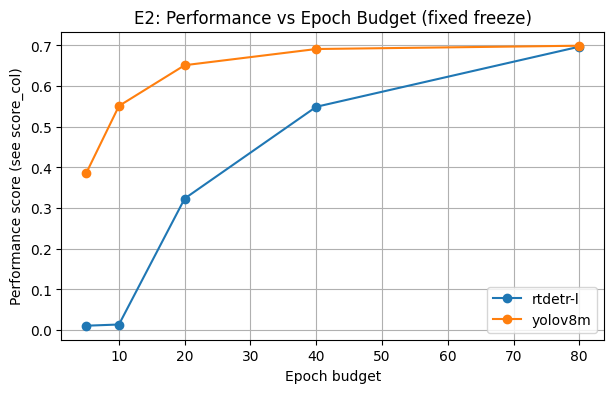

Saved: experiments/Experiment_2/runs/_plots/time_vs_epochs.png and experiments/Experiment_2/runs/_plots/time_vs_epochs.pdf


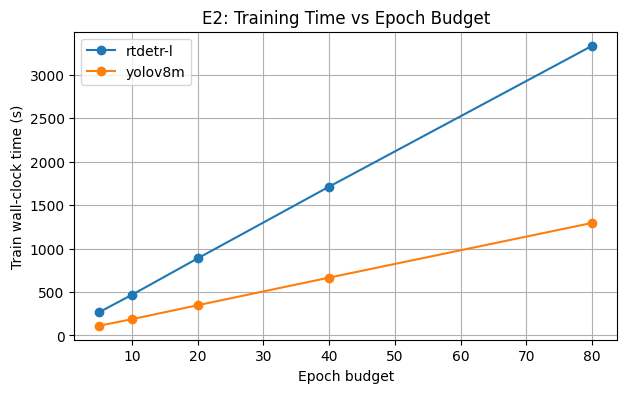

Plots saved under: /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/E2_runs/_plots


In [41]:
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd

PLOTS_DIR = runs_root / "_plots"
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

# Reload aggregate if needed

agg_path = runs_root / "_aggregate_e2.csv"
agg = pd.read_csv(agg_path) if agg_path.exists() else agg

def savefig(name: str):
    png = PLOTS_DIR / f"{name}.png"
    pdf = PLOTS_DIR / f"{name}.pdf"
    plt.savefig(png, bbox_inches="tight", dpi=200)
    plt.savefig(pdf, bbox_inches="tight")
    print(f"Saved: {png} and {pdf}")

# Plot 1: score vs epochs (per model)
plt.figure(figsize=(7,4))
for model, g in agg.groupby("model"):
    g = g.sort_values("epochs")
    plt.plot(g["epochs"], g["score"], marker="o", label=model)
plt.xlabel("Epoch budget")
plt.ylabel("Performance score (see score_col)")
plt.title("E2: Performance vs Epoch Budget (fixed freeze)")
plt.grid(True)
plt.legend()
savefig("perf_vs_epochs")
plt.show()

# Plot 2: wall time vs epochs (per model)
plt.figure(figsize=(7,4))
for model, g in agg.groupby("model"):
    g = g.sort_values("epochs")
    plt.plot(g["epochs"], g["train_wall_s"], marker="o", label=model)
plt.xlabel("Epoch budget")
plt.ylabel("Train wall-clock time (s)")
plt.title("E2: Training Time vs Epoch Budget")
plt.grid(True)
plt.legend()
savefig("time_vs_epochs")
plt.show()

print("Plots saved under:", PLOTS_DIR.resolve())


## 8. Inspect One Run (Optional)


In [42]:
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

PLOTS_DIR = Path(PLOTS_DIR)
PLOTS_DIR.mkdir(parents=True, exist_ok=True)

# E2 run dirs: runs_root/<model>/<freeze>/E<epochs>/
run_dirs = sorted([
    p for p in runs_root.glob("*/*/E*")
    if p.is_dir() and re.fullmatch(r"E\d+", p.name)
])

REL_PNGS = [
    ("threshold_sweep", "eval/test/plots/threshold_sweep.png"),
    ("per_class_f1", "eval/test/plots/per_class_f1.png"),
    ("confusion_matrix", "eval/test/plots/confusion_matrix.png"),
    ("count_mae_comparison", "eval/test/plots/count_mae_comparison.png"),
]

def make_contact_sheet_for_run(run_dir: Path):
    # run_dir = runs_root/<model>/<freeze>/E<epochs>
    model = run_dir.parents[1].name
    freeze_id = run_dir.parents[0].name
    epochs_tag = run_dir.name  # e.g., "E10"
    out_base = f"{model}_{freeze_id}_{epochs_tag}_TEST_plots_contact_sheet"

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()

    missing = []
    for i, (title, rel) in enumerate(REL_PNGS):
        ax = axes[i]
        p = run_dir / rel
        if p.exists():
            img = mpimg.imread(str(p))
            ax.imshow(img)
            ax.set_title(title)
        else:
            ax.text(0.5, 0.5, f"MISSING\n{rel}", ha="center", va="center")
            ax.set_title(title)
            missing.append(rel)
        ax.axis("off")

    fig.suptitle(f"{model}/{freeze_id}/{epochs_tag} — TEST evaluator plots", fontsize=16)

    png_out = PLOTS_DIR / f"{out_base}.png"
    pdf_out = PLOTS_DIR / f"{out_base}.pdf"
    fig.tight_layout(rect=[0, 0, 1, 0.95])
    fig.savefig(png_out, dpi=200, bbox_inches="tight")
    fig.savefig(pdf_out, bbox_inches="tight")
    plt.close(fig)

    return png_out, pdf_out, missing

saved = []
all_missing = []

for rd in run_dirs:
    png_out, pdf_out, missing = make_contact_sheet_for_run(rd)
    saved.append((str(rd), str(png_out), str(pdf_out)))
    if missing:
        all_missing.append((str(rd), missing))

print(f"Saved {len(saved)} contact sheets into: {PLOTS_DIR.resolve()}")
if all_missing:
    print("\nRuns with missing TEST plot files:")
    for rd, miss in all_missing:
        print(f" - {rd}")
        for m in miss:
            print(f"    * {m}")


Saved 10 contact sheets into: /content/drive/MyDrive/Colab_Outputs/Deep_Learning_Project_Gil_Alon/E2_20260121_190621/E2_runs/_plots


## Summary

This notebook:
1. Clones the repo and mounts Google Drive.
2. Downloads the dataset (Roboflow) and builds evaluation indices.
3. Writes an absolute-path `data/processed/data.yaml` for Ultralytics.
4. Runs **Experiment 2** epoch-budget sweep via `experiments/Experiment_2/run_experiment2.sh`.
5. Verifies expected artifacts and produces E2 plots.
